In [1]:
# general purpose
import pandas as pd
import numpy as np
import time
import scipy

# visualization tools
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import plotly.express as px

# manifold learning
from sklearn.manifold import TSNE

# standard clustering
import sklearn.cluster as cl
import sklearn.metrics as ms
import sklearn.mixture as mx
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
from sklearn import decomposition
from sklearn.cluster import DBSCAN


# hdbscan
import hdbscan 

# For density validation
from DBCV import DBCV
from scipy.spatial.distance import euclidean

# To read external config file
import yaml

In [2]:
# From local files
from density_functions import (clustering_dbscan, 
                                find_best_min_samples, best_eps, 
                                plotting_two_vars, 
                              find_best_min_samples_optics)
from prototype_functions import (find_n_clusters_kmeans)
from general_purpose_functions import (pre_processing, plot_all_vars, TSNE_manifold_plot)
from probabilistic_functions import (find_n_clusters_gaussian, plot_all_vars_prob, TSNE_manifold_plot_prob)

# Introduzione

L"obiettivo di questo notebook è di fare un grosso insieme per andare a confrontare le varie tecniche e metodi. I parametri di validazioni usati sono sopratutti visivi anche se, ove possibile, si cerca di usare tecniche analitiche, e.g. *Silhouette Coefficient*.

Per eseguire questi confronti, si usa l'appoggio di librerie esterne con delle funzioni e di file yaml.

Gli algoritmi che si vanno a confrontare sono divisi in più categorie:

- Su prototipo (Kmeans, Affinity Propagation)
- Densità (DBSCAN, HDBSCAN, OPTICS)
- Probabilistici (Gaussian Mixture)

Tutti questi vengono testati sia considerando i dati multidimensionali, sia eseguendo delle proiezioni tramite **manifold learning**.

In [3]:
print("-- Loading config file")
with open("../density_based_clustering/config.yml", "r") as file:
    load_vars = yaml.safe_load(file)
print("-- Pre-processing")
df_person_var, df_current_investment = pre_processing()

# Standardize the variables
# Some have already decent values, while others do not.
X = StandardScaler().fit_transform(df_person_var[load_vars["clustering_variables"]])

-- Loading config file
-- Pre-processing


In [4]:
print("-- TSNE manifold learning projection in 2D")
N_transform = 2
X_transformed = TSNE(n_components = N_transform).fit_transform(X)

-- TSNE manifold learning projection in 2D


-- Manifold Learning tranformed data (without clustering)


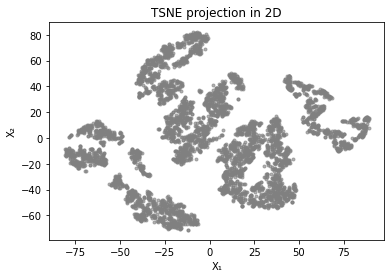

In [5]:
print("-- Manifold Learning tranformed data (without clustering)")
plt.scatter(X_transformed[:,0], 
                X_transformed[:,1], 
                c='grey',
                alpha=0.6,
                marker='.')
plt.title("TSNE projection in 2D")
plt.xlabel("X₁")
plt.ylabel("X₂")
plt.show()

# Prototype Based

## K-Means

### Multidimensional 

-- Finding optimal number of clusters with silhouette
Best Silhouette: 0.3673996364136851
Number of Clusters for it: 2


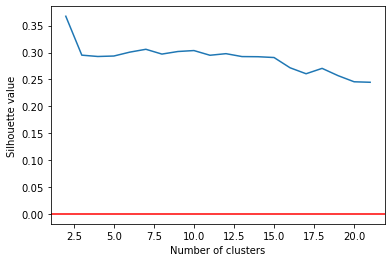

In [6]:
print("-- Finding optimal number of clusters with silhouette")
RESULTS = find_n_clusters_kmeans(X = X)

In [7]:
optimal_N_clusters = RESULTS['N_cluster']

In [9]:
kmeans_clustrerer = cl.KMeans(n_clusters=optimal_N_clusters,
                             n_init=int(1e2),
                             init='k-means++',
                             max_iter=int(1e3),
                             tol=1e-3,
                             verbose=False
                             ).fit(X)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X, 
                                                                 kmeans_clustrerer.labels_))

Silhouette Coefficient: 0.366


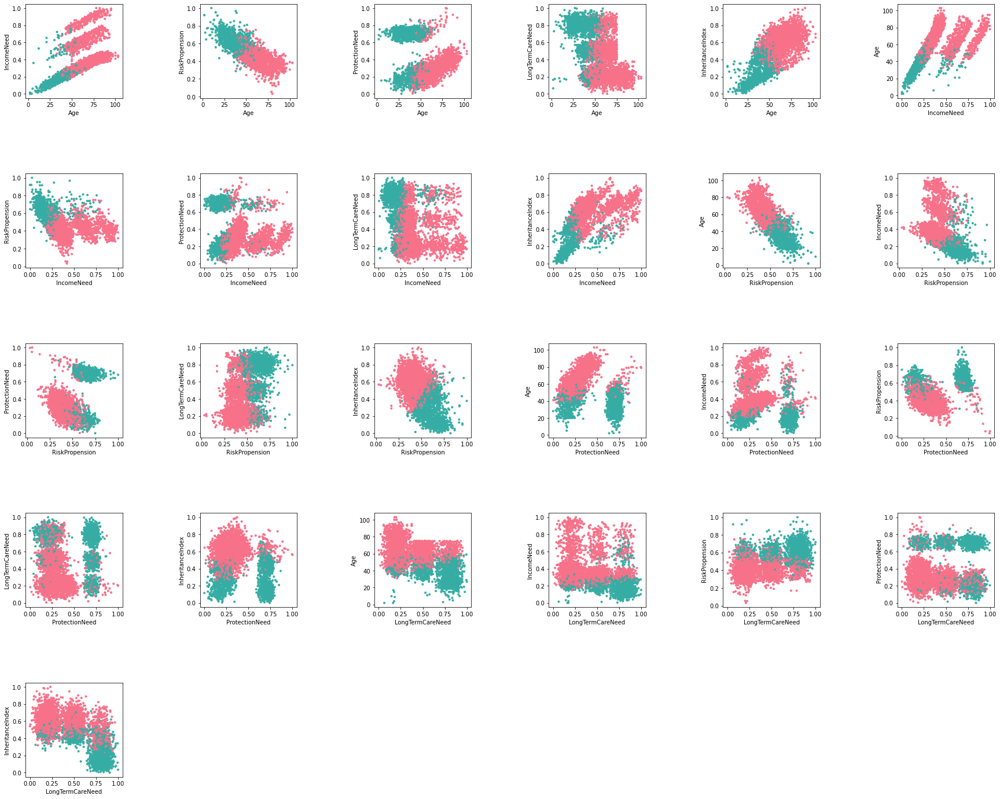

In [10]:
plot_all_vars(clusterer=kmeans_clustrerer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

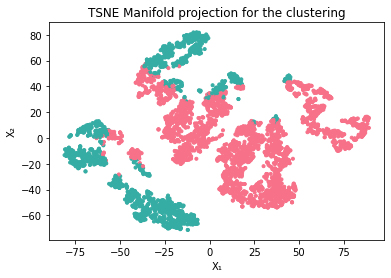

In [11]:
TSNE_manifold_plot(clusterer=kmeans_clustrerer, 
             X=X_transformed,
             transform=False)

### TSNE Projection

-- Finding optimal number of clusters with silhouette
Best Silhouette: 0.5089842
Number of Clusters for it: 10


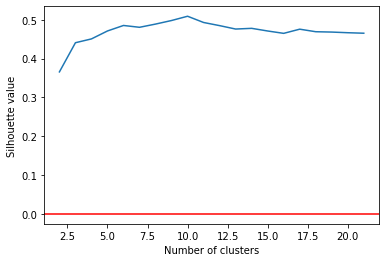

In [13]:
print("-- Finding optimal number of clusters with silhouette")
RESULTS = find_n_clusters_kmeans(X = X_transformed)

In [14]:
optimal_N_clusters = RESULTS['N_cluster']

In [15]:
kmeans_clustrerer = cl.KMeans(n_clusters=optimal_N_clusters,
                             n_init=int(1e2),
                             init='k-means++',
                             max_iter=int(1e3),
                             tol=1e-3,
                             verbose=False
                             ).fit(X_transformed)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_transformed, 
                                                                 kmeans_clustrerer.labels_))

Silhouette Coefficient: 0.510


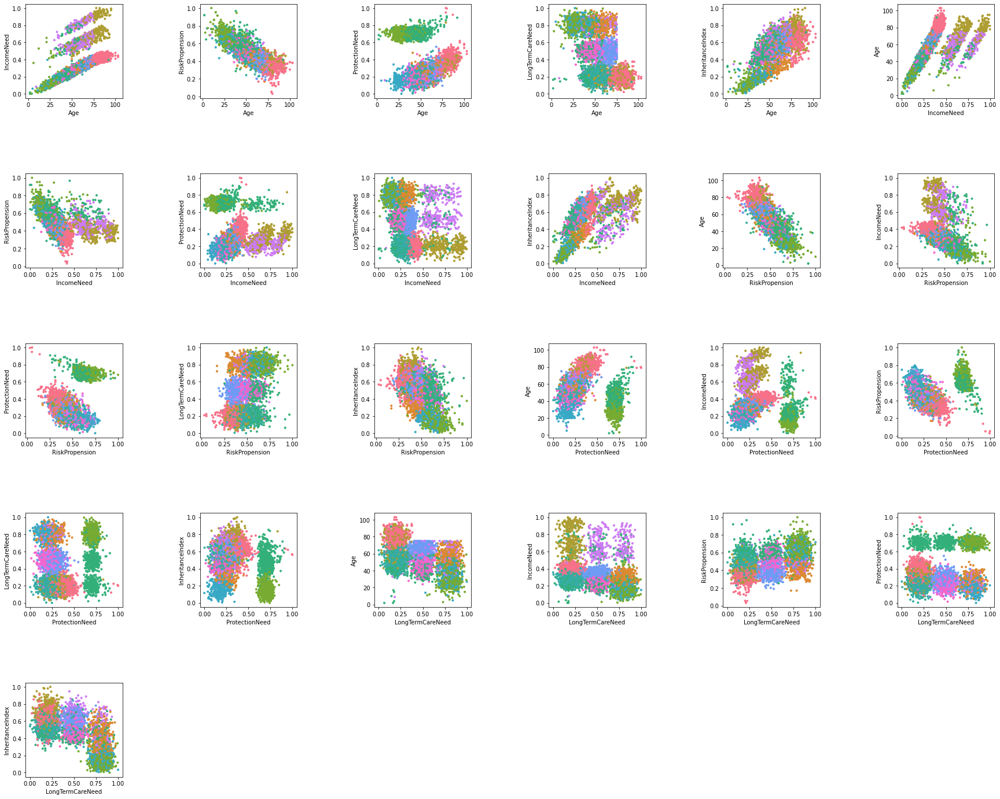

In [16]:
plot_all_vars(clusterer=kmeans_clustrerer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

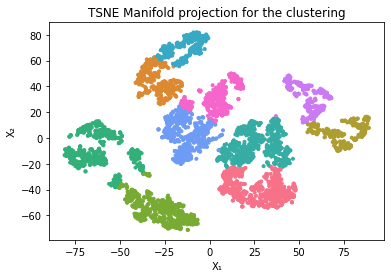

In [17]:
TSNE_manifold_plot(clusterer=kmeans_clustrerer, 
             X=X_transformed,
             transform=False)

## Affinity Propagation

### Multidimensional

Per questo algoritmo, non ci sono molto parametri su cui fare *tuning*, in quanto è di tipo stocastico. L'unica cosa che si può modificare un po' è *damping*, ma provando ho notato che non cambia praticamente niente.

In [24]:
affinity_clusterer = cl.AffinityPropagation(damping=0.5, 
                                            max_iter=200, 
                                            convergence_iter=15, 
                                            verbose=False, 
                                            random_state=3423).fit(X)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X, 
                                                                 affinity_clusterer.labels_))
print("Number of clusters", max(affinity_clusterer.labels_)+1)

Silhouette Coefficient: 0.194
Number of clusters 105


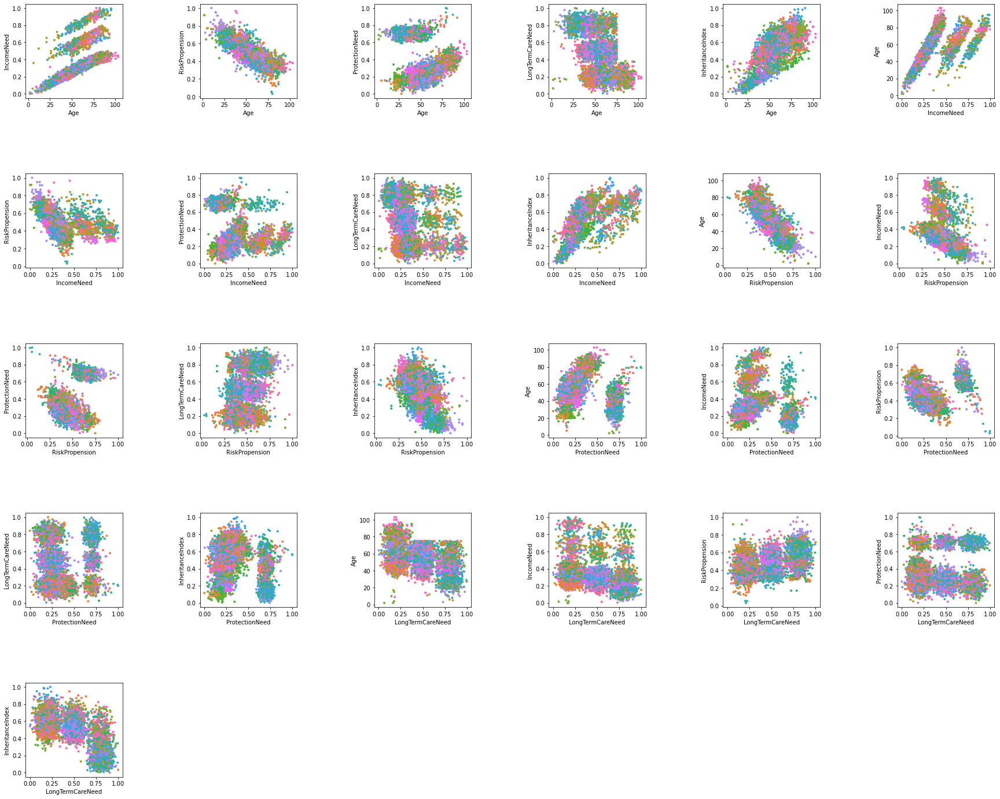

In [25]:
plot_all_vars(clusterer=affinity_clusterer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

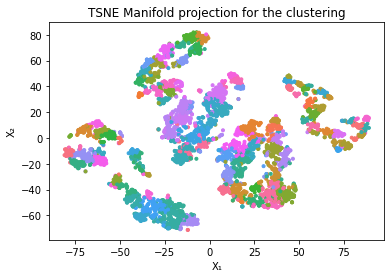

In [26]:
TSNE_manifold_plot(clusterer=affinity_clusterer, 
             X=X_transformed,
             transform=False)

### TSNE projection

In [21]:
affinity_clusterer = cl.AffinityPropagation(damping=0.65, 
                                            max_iter=200, 
                                            convergence_iter=15, 
                                            verbose=False, 
                                            random_state=3423).fit(X_transformed)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_transformed, 
                                                                 affinity_clusterer.labels_))
print("Number of clusters", max(affinity_clusterer.labels_)+1)

Silhouette Coefficient: 0.437
Number of clusters 44


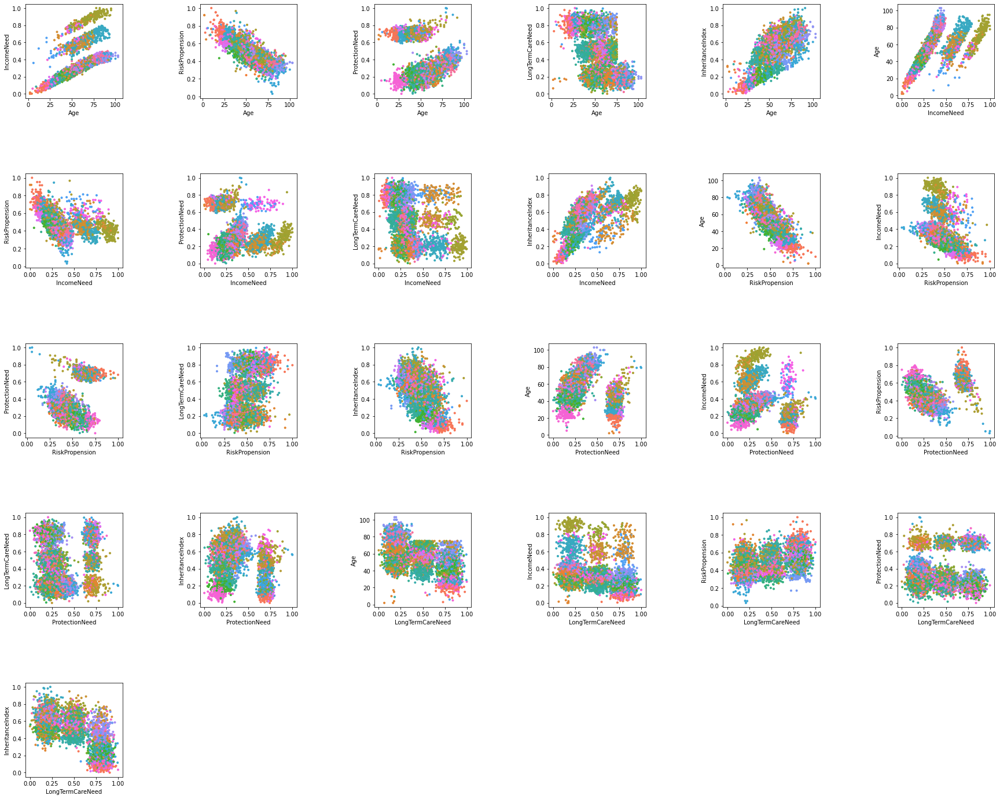

In [22]:
plot_all_vars(clusterer=affinity_clusterer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

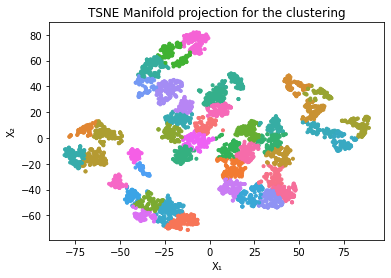

In [23]:
TSNE_manifold_plot(clusterer=affinity_clusterer, 
             X=X_transformed,
             transform=False)

# Density Based

## DBSCAN

### Multidimensional

-- Determining optimal eps


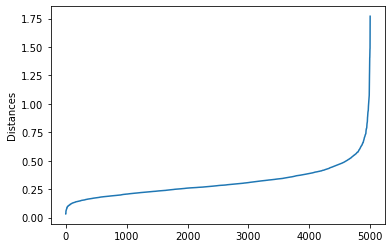

Please insert the current number of eps.
0.65


In [28]:
print("-- Determining optimal eps")
best_eps(X = X)
print("Please insert the current number of eps.")
BEST_EPS = float(input())

-- Determining optimal min_samples
Best Silhouette: 0.5756985813790184
Number of Clusters for it: 4
Min_sample value for it: 27


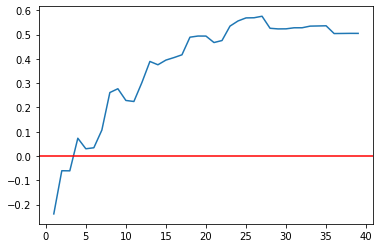

In [29]:
print("-- Determining optimal min_samples")
RESULTS = find_best_min_samples(X = X, START = 1, END = 40, EPS = BEST_EPS)
BEST_MIN = RESULTS["Min"]

In [30]:
EPS = BEST_EPS
MIN_SAMPLES = BEST_MIN

In [31]:
dbscan_clusterer = cl.DBSCAN(eps = EPS, 
                          min_samples = MIN_SAMPLES
                         ).fit(X)
dbscan_labels = dbscan_clusterer.labels_

In [32]:
dbscan_labels = dbscan_clusterer.labels_
n_clusters_ = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
n_noise_ = list(dbscan_labels).count(-1)

X_score = X[np.where(dbscan_labels > 0)]
labels_score = dbscan_labels[np.where(dbscan_labels > 0)]

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % ms.silhouette_score(X_score, labels_score))


Estimated number of clusters: 4
Estimated number of noise points: 1077
Silhouette Coefficient: 0.576


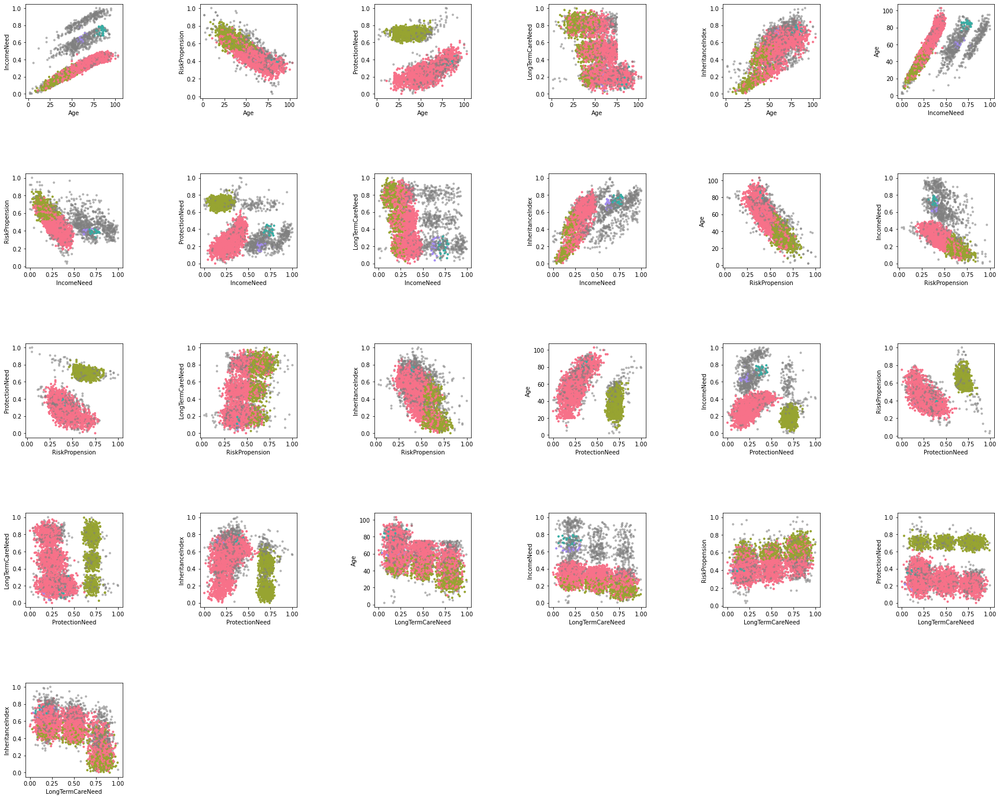

In [33]:
plot_all_vars(clusterer=dbscan_clusterer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

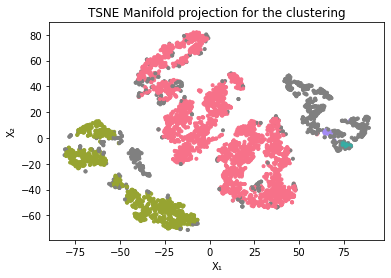

In [34]:
TSNE_manifold_plot(clusterer=dbscan_clusterer, 
             X=X_transformed,
             transform=False)

### TSNE Projection

-- Determining optimal eps


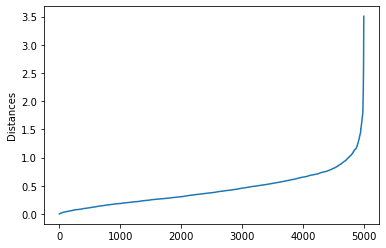

Please insert the current number of eps.
1.2


In [37]:
print("-- Determining optimal eps")
best_eps(X = X_transformed)
print("Please insert the current number of eps.")
BEST_EPS = float(input())

-- Determining optimal min_samples
Best Silhouette: 0.9545143
Number of Clusters for it: 6
Min_sample value for it: 15


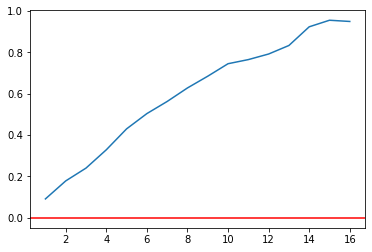

In [38]:
print("-- Determining optimal min_samples")
RESULTS = find_best_min_samples(X = X_transformed, START = 1, END = 17, EPS = BEST_EPS)
BEST_MIN = RESULTS["Min"]

In [39]:
EPS = BEST_EPS
MIN_SAMPLES = BEST_MIN

In [40]:
dbscan_clusterer = cl.DBSCAN(eps = EPS, 
                          min_samples = MIN_SAMPLES
                         ).fit(X_transformed)

In [41]:
dbscan_labels = dbscan_clusterer.labels_
n_clusters_ = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
n_noise_ = list(dbscan_labels).count(-1)

X_score = X[np.where(dbscan_labels > 0)]
labels_score = dbscan_labels[np.where(dbscan_labels > 0)]

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_score, labels_score))


Estimated number of clusters: 6
Estimated number of noise points: 4896
Silhouette Coefficient: 0.705


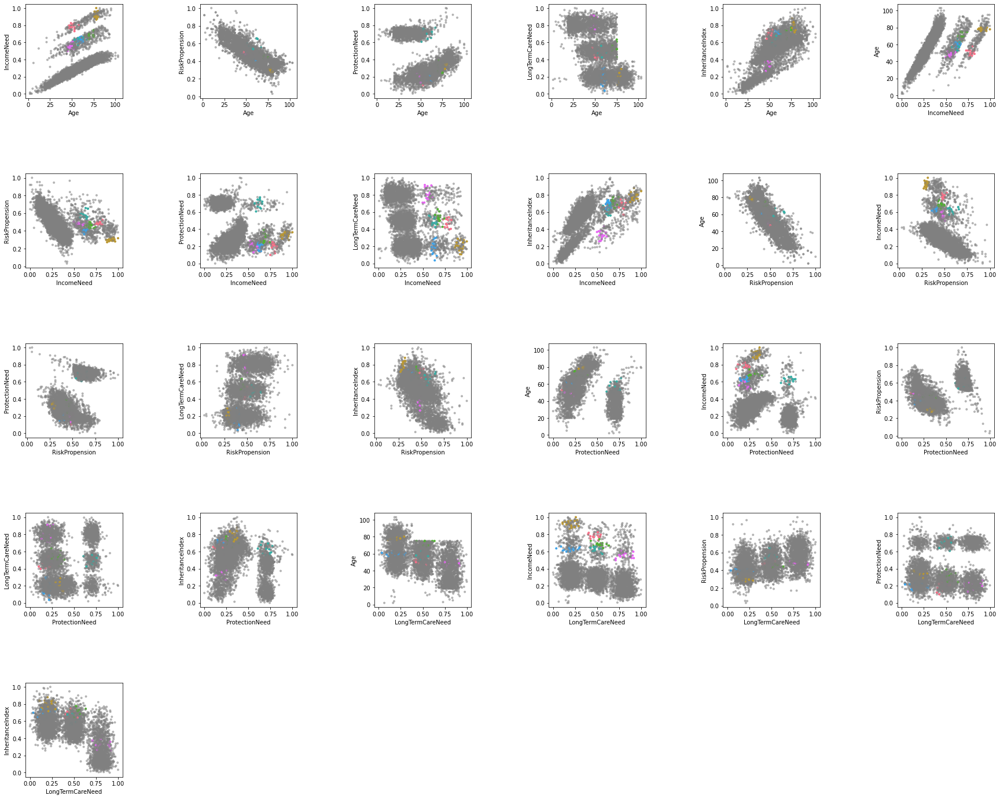

In [42]:
plot_all_vars(clusterer=dbscan_clusterer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

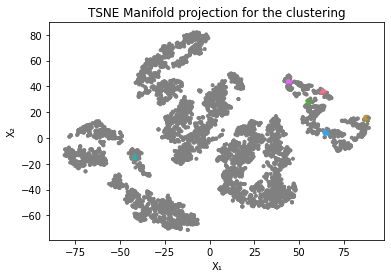

In [43]:
TSNE_manifold_plot(clusterer=dbscan_clusterer, 
             X=X_transformed,
             transform=False)

## OPTICS

Si noti come questo algoritmo giri molto più lento di un DBSCAN.

### Multidimensional

-- Determining optimal eps


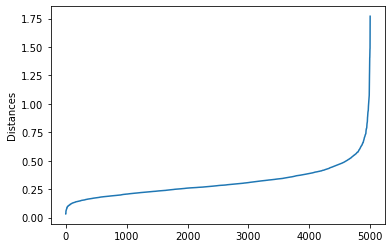

Please insert the current number of eps.
0.65


In [44]:
print("-- Determining optimal eps")
best_eps(X = X)
print("Please insert the current number of eps.")
BEST_EPS = float(input())

-- Determining optimal min_samples
Best Silhouette: 0.5923260313671662
Number of Clusters for it: 19
Min_sample value for it: 10


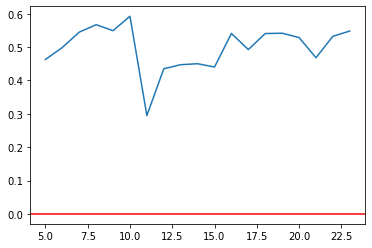

In [47]:
print("-- Determining optimal min_samples")
RESULTS = find_best_min_samples_optics(X = X, START = 5, END = 24, EPS = BEST_EPS)
BEST_MIN = RESULTS["Min"]

In [48]:
EPS = BEST_EPS
MIN_SAMPLES = BEST_MIN

In [49]:
optics_clusterer = cl.OPTICS(max_eps = EPS, 
                          min_samples = MIN_SAMPLES
                         ).fit(X)

In [50]:
optics_labels = optics_clusterer.labels_
n_clusters_ = len(set(optics_labels)) - (1 if -1 in optics_labels else 0)
n_noise_ = list(optics_labels).count(-1)

X_score = X[np.where(optics_labels > 0)]
labels_score = optics_labels[np.where(optics_labels > 0)]

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_score, labels_score))


Estimated number of clusters: 19
Estimated number of noise points: 4720
Silhouette Coefficient: 0.592


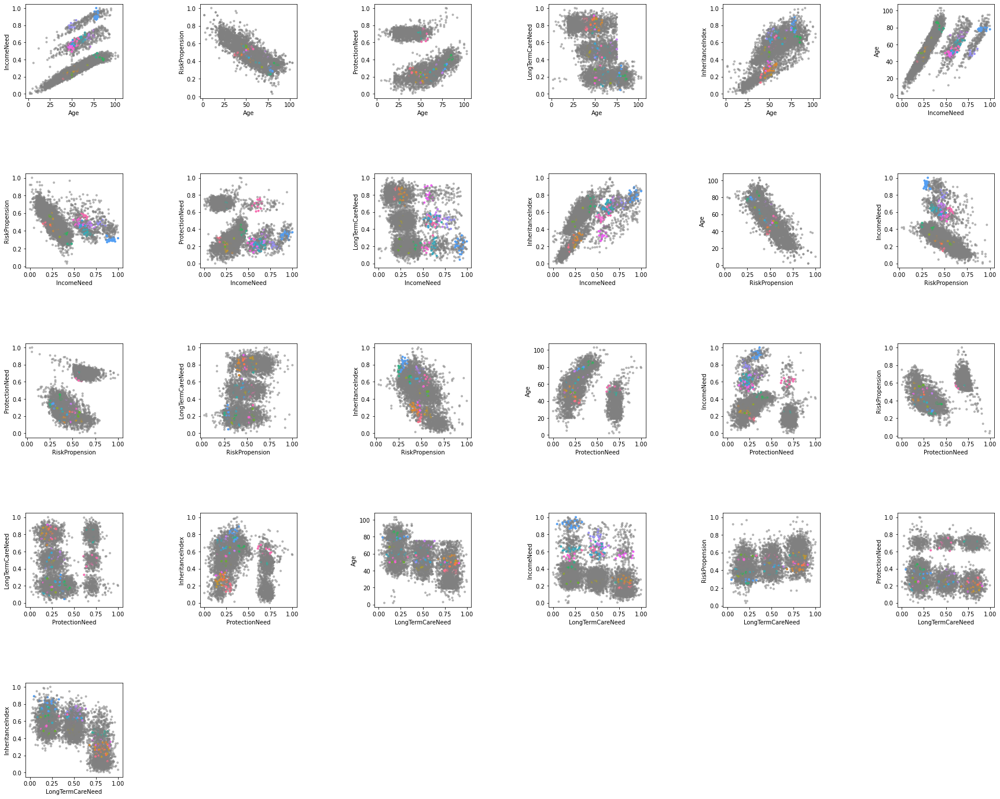

In [51]:
plot_all_vars(clusterer=optics_clusterer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

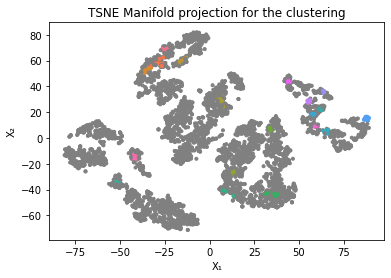

In [52]:
TSNE_manifold_plot(clusterer=optics_clusterer, 
             X=X_transformed,
             transform=False)

### TSNE Projection

-- Determining optimal eps


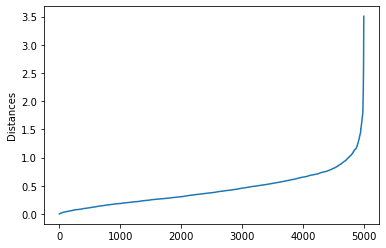

Please insert the current number of eps.
1.3


In [55]:
print("-- Determining optimal eps")
best_eps(X = X_transformed)
print("Please insert the current number of eps.")
BEST_EPS = float(input())

-- Determining optimal min_samples
Best Silhouette: 0.89973724
Number of Clusters for it: 9
Min_sample value for it: 14


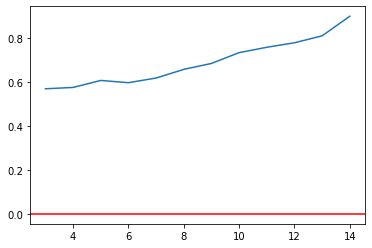

In [56]:
print("-- Determining optimal min_samples")
RESULTS = find_best_min_samples_optics(X = X_transformed, START = 3, END = 15, EPS = BEST_EPS)
BEST_MIN = RESULTS["Min"]

In [57]:
EPS = BEST_EPS
MIN_SAMPLES = BEST_MIN

In [58]:
optics_clusterer = cl.OPTICS(max_eps = EPS, 
                          min_samples = MIN_SAMPLES
                         ).fit(X_transformed)

In [59]:
optics_labels = optics_clusterer.labels_
n_clusters_ = len(set(optics_labels)) - (1 if -1 in optics_labels else 0)
n_noise_ = list(optics_labels).count(-1)

X_score = X[np.where(optics_labels > 0)]
labels_score = optics_labels[np.where(optics_labels > 0)]

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_score, labels_score))

Estimated number of clusters: 9
Estimated number of noise points: 4833
Silhouette Coefficient: 0.572


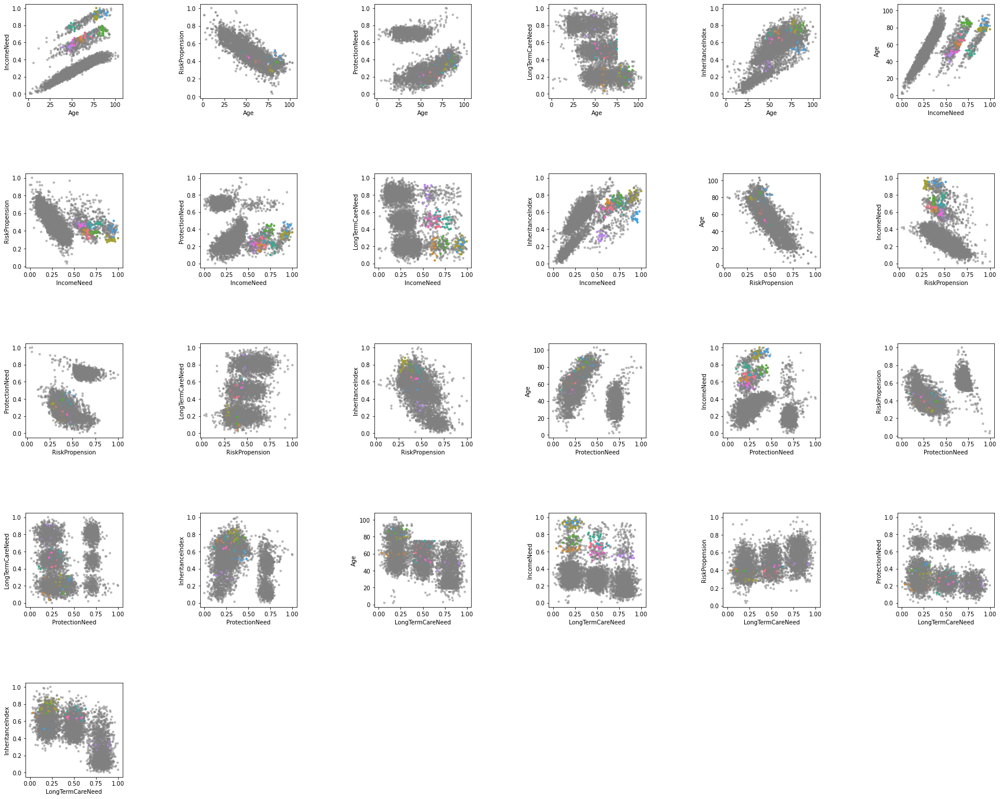

In [60]:
plot_all_vars(clusterer=optics_clusterer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

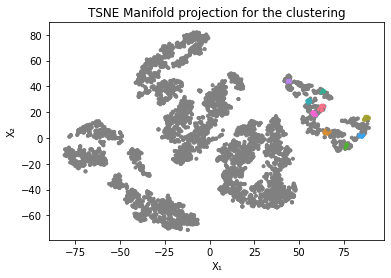

In [61]:
TSNE_manifold_plot(clusterer=optics_clusterer, 
             X=X_transformed,
             transform=False)

## HDBSCAN

Per quanto riguarda `min_cluster_size`, si può sicuramente fare un ragionamento anche da un punto di vista pratico, e.g. non voglio cluster troppo piccoli.

### Multidimensional

In [109]:
MIN_CLUSTER_SIZE = 60
MIN_SAMPLES = 7

In [110]:
hdbscan_clusterer = hdbscan.HDBSCAN(metric = "euclidean", 
                            gen_min_span_tree=True,
                            min_cluster_size=MIN_CLUSTER_SIZE, 
                            min_samples=MIN_SAMPLES).fit(X)

In [111]:
hdbscan_labels = hdbscan_clusterer.labels_
n_clusters_ = len(set(hdbscan_labels)) - (1 if -1 in hdbscan_labels else 0)
n_noise_ = list(hdbscan_labels).count(-1)

X_score = X[np.where(hdbscan_labels > 0)]
labels_score = hdbscan_labels[np.where(hdbscan_labels > 0)]

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_score, labels_score))


Estimated number of clusters: 4
Estimated number of noise points: 584
Silhouette Coefficient: 0.279


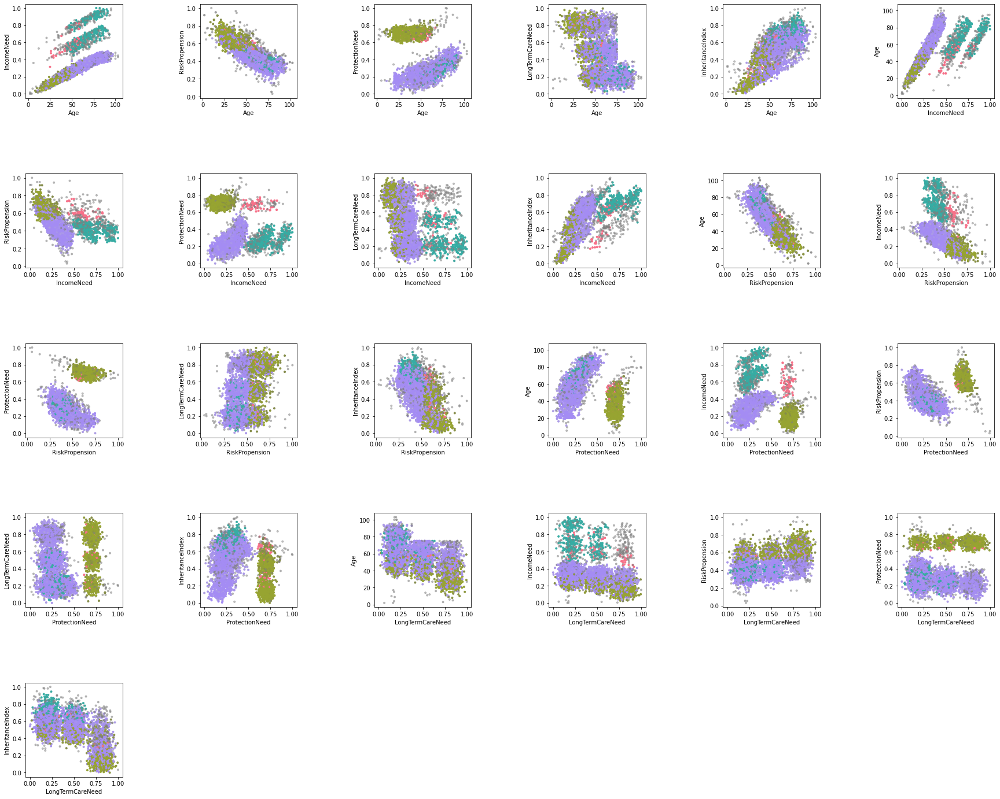

In [112]:
plot_all_vars(clusterer=hdbscan_clusterer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

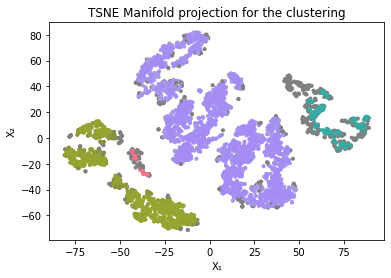

In [113]:
TSNE_manifold_plot(clusterer=hdbscan_clusterer, 
             X=X_transformed,
             transform=False, cluster_name = 'hdbscan_multi')

### TSNE Projection

In [129]:
MIN_CLUSTER_SIZE = 300
MIN_SAMPLES = 7

In [130]:
hdbscan_clusterer = hdbscan.HDBSCAN(metric = "euclidean", 
                            gen_min_span_tree=True,
                            min_cluster_size=MIN_CLUSTER_SIZE, 
                            min_samples=MIN_SAMPLES).fit(X_transformed)

In [131]:
hdbscan_labels = hdbscan_clusterer.labels_
n_clusters_ = len(set(hdbscan_labels)) - (1 if -1 in hdbscan_labels else 0)
n_noise_ = list(hdbscan_labels).count(-1)

X_score = X[np.where(hdbscan_labels > 0)]
labels_score = hdbscan_labels[np.where(hdbscan_labels > 0)]

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_score, labels_score))


Estimated number of clusters: 6
Estimated number of noise points: 12
Silhouette Coefficient: 0.223


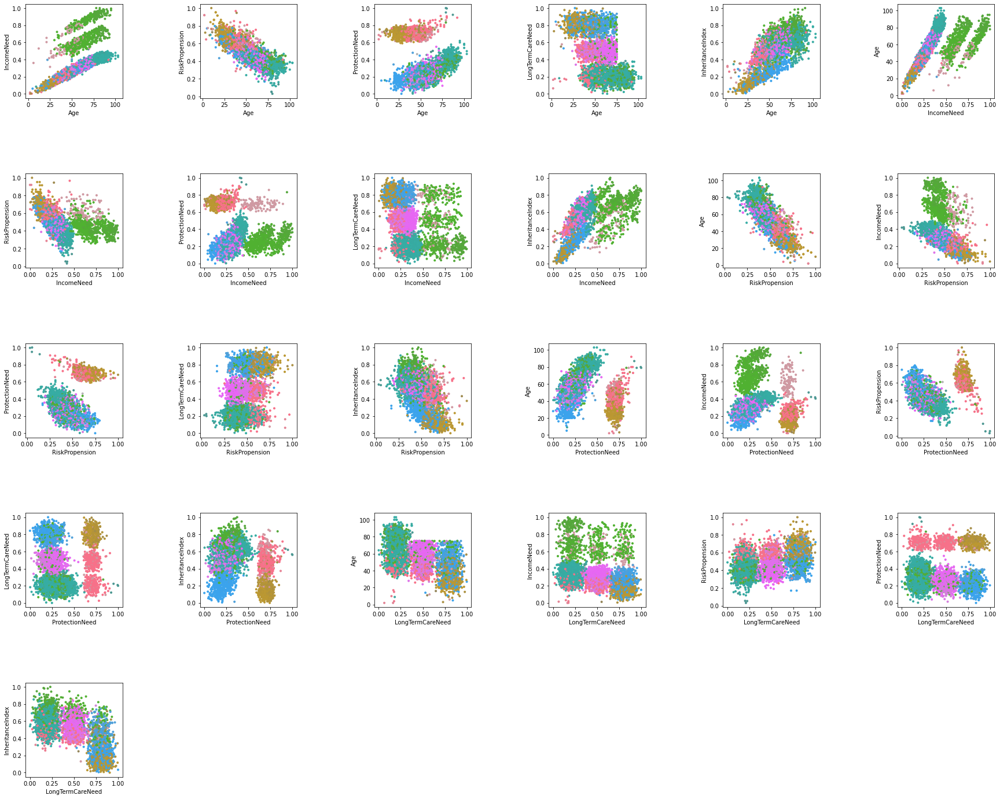

In [132]:
plot_all_vars(clusterer=hdbscan_clusterer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

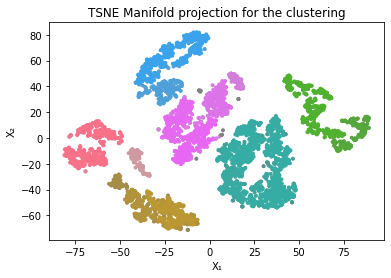

In [133]:
TSNE_manifold_plot(clusterer=hdbscan_clusterer, 
             X=X_transformed,
             transform=False, cluster_name = 'hdbscan_TsenProjection')

### Leaf Multidimensional

In [101]:
MIN_CLUSTER_SIZE = 300
MIN_SAMPLES = 2

In [102]:
hdbscan_clusterer = hdbscan.HDBSCAN(metric = "euclidean", 
                            gen_min_span_tree=True,
                            min_cluster_size=MIN_CLUSTER_SIZE, 
                            min_samples=MIN_SAMPLES, 
                            cluster_selection_method='leaf').fit(X)

In [103]:
hdbscan_labels = hdbscan_clusterer.labels_
n_clusters_ = len(set(hdbscan_labels)) - (1 if -1 in hdbscan_labels else 0)
n_noise_ = list(hdbscan_labels).count(-1)

X_score = X[np.where(hdbscan_labels > 0)]
labels_score = hdbscan_labels[np.where(hdbscan_labels > 0)]

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_score, labels_score))


Estimated number of clusters: 5
Estimated number of noise points: 1655
Silhouette Coefficient: 0.266


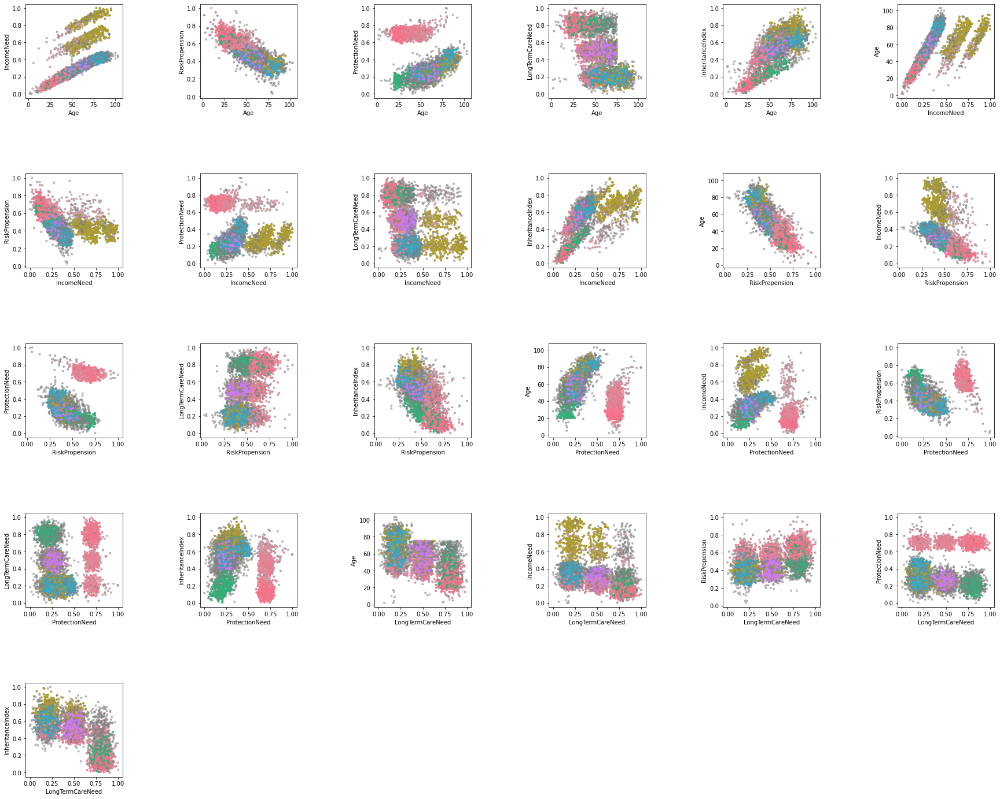

In [104]:
plot_all_vars(clusterer=hdbscan_clusterer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

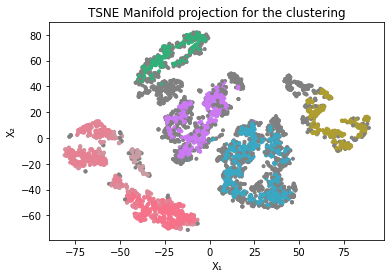

In [107]:
TSNE_manifold_plot(clusterer=hdbscan_clusterer, 
                 X=X_transformed,
                 transform=False,
                   cluster_name = 'hdbscan_leaf_multi')

### Leaf TSNE Projection

In [134]:
MIN_CLUSTER_SIZE = 300
MIN_SAMPLES = 30

In [135]:
hdbscan_clusterer = hdbscan.HDBSCAN(metric = "euclidean", 
                                gen_min_span_tree=True,
                                min_cluster_size=MIN_CLUSTER_SIZE, 
                                min_samples=MIN_SAMPLES,
                                   cluster_selection_method='leaf').fit(X_transformed)

In [136]:
hdbscan_labels = hdbscan_clusterer.labels_
n_clusters_ = len(set(hdbscan_labels)) - (1 if -1 in hdbscan_labels else 0)
n_noise_ = list(hdbscan_labels).count(-1)

X_score = X[np.where(hdbscan_labels > 0)]
labels_score = hdbscan_labels[np.where(hdbscan_labels > 0)]

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_score, labels_score))


Estimated number of clusters: 6
Estimated number of noise points: 155
Silhouette Coefficient: 0.239


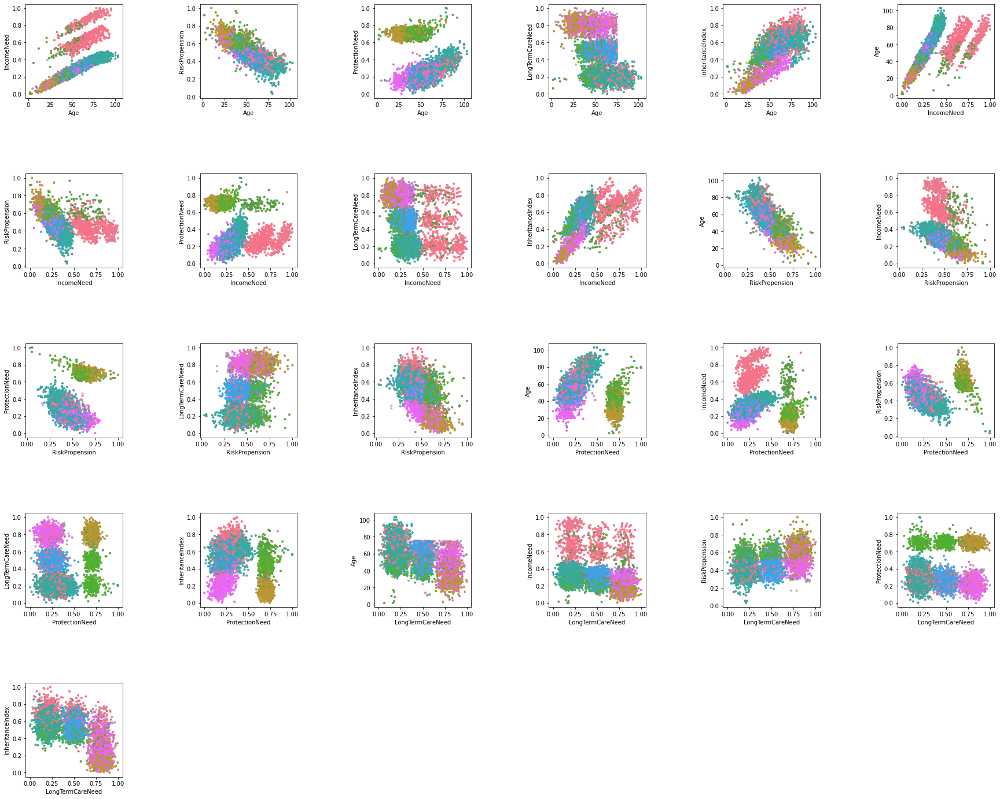

In [137]:
plot_all_vars(clusterer=hdbscan_clusterer, 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

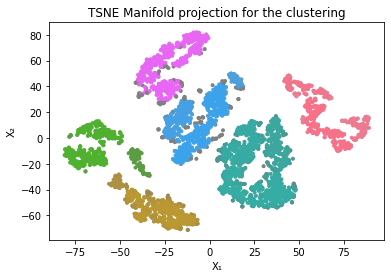

In [138]:
TSNE_manifold_plot(clusterer=hdbscan_clusterer, 
             X=X_transformed,
             transform=False, cluster_name = 'hdbscan_TsenProjection_leaf')

# Probabilistic

## Gaussian Mixture

### Multidimensional

In [72]:
cv_types = ['spherical', 'tied', 'diag', 'full']

Best (lowest) BIC: 50663.758125768596
Number of Clusters for it: 28


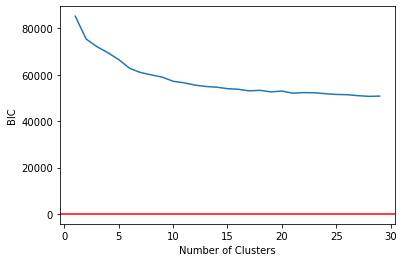

Best (lowest) BIC: 45032.97167593471
Number of Clusters for it: 28


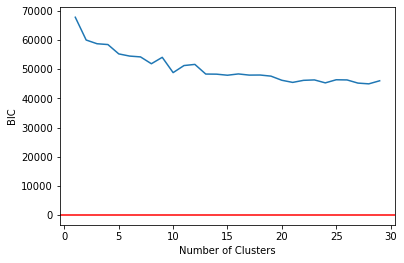

Best (lowest) BIC: 46316.033970756995
Number of Clusters for it: 28


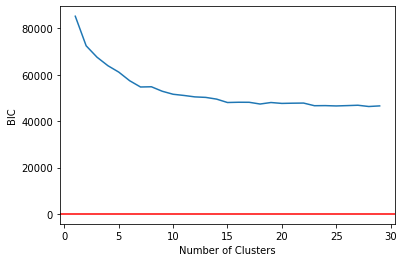

Best (lowest) BIC: 42913.872046644436
Number of Clusters for it: 17


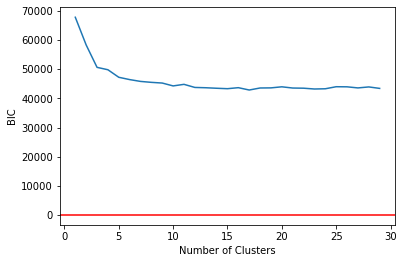

In [73]:
results = [find_n_clusters_gaussian(X=X, START=1, END=30, cv=cv) for cv in cv_types]

In [74]:
Best_cv = 'full'
best_N = 17

In [75]:
gauss_clusterer = mx.GaussianMixture(n_components=best_N,
                covariance_type=Best_cv).fit(X)

In [76]:
gauss_labels = gauss_clusterer.predict(X)
n_clusters_ = len(set(gauss_labels)) - (1 if -1 in gauss_labels else 0)
n_noise_ = list(gauss_labels).count(-1)

X_score = X[np.where(gauss_labels > 0)]
labels_score = gauss_labels[np.where(gauss_labels > 0)]

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_score, labels_score))

Estimated number of clusters: 17
Estimated number of noise points: 0
Silhouette Coefficient: 0.163


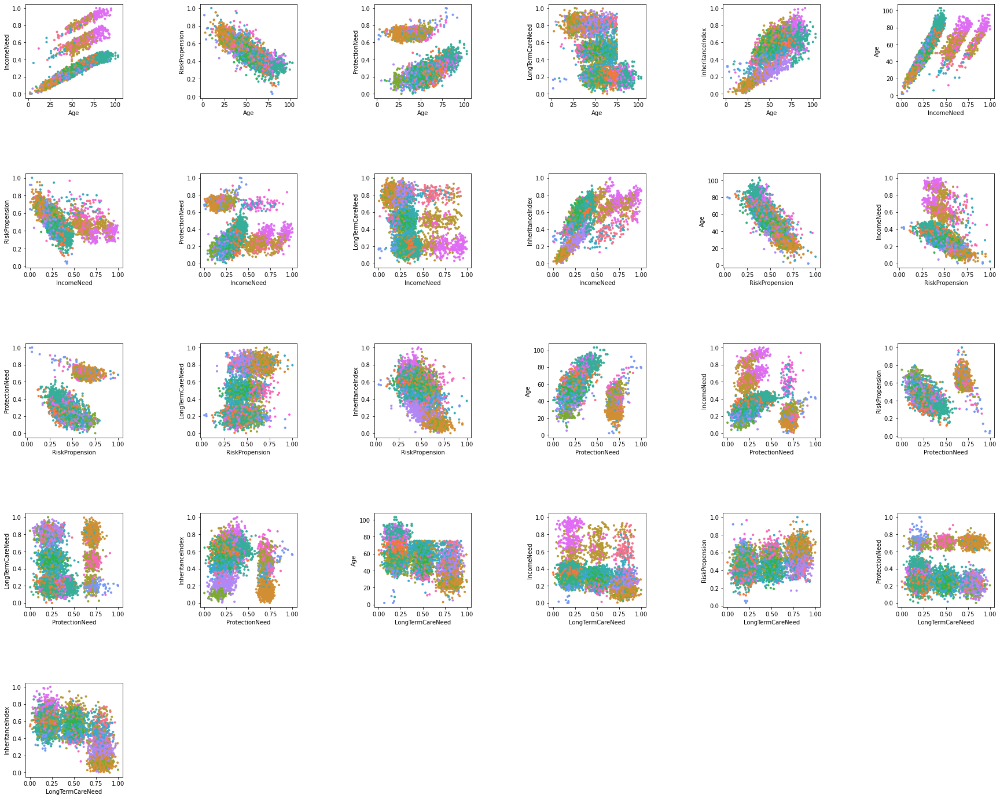

In [77]:
plot_all_vars_prob(labels=gauss_clusterer.predict(X), 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

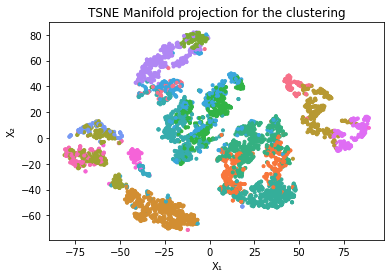

In [78]:
TSNE_manifold_plot_prob(labels=gauss_clusterer.predict(X), 
             X=X_transformed,
             transform=False)

### TSNE Projection

In [79]:
cv_types = ['spherical', 'tied', 'diag', 'full']

Best (lowest) BIC: 91815.80866361904
Number of Clusters for it: 59


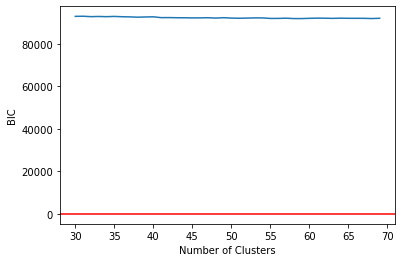

Best (lowest) BIC: 91815.71796324867
Number of Clusters for it: 68


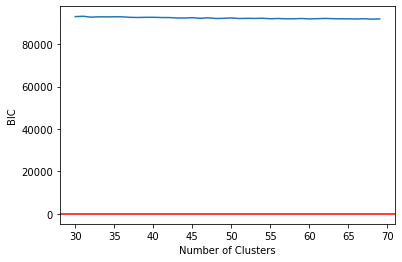

Best (lowest) BIC: 91853.09317260419
Number of Clusters for it: 60


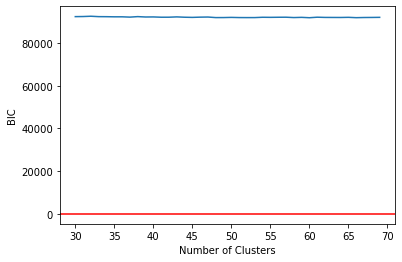

Best (lowest) BIC: 91555.02956333468
Number of Clusters for it: 54


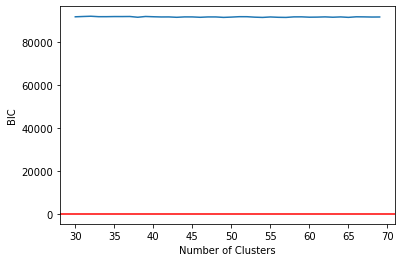

In [80]:
results = [find_n_clusters_gaussian(X=X_transformed, START=30, END=70, cv=cv) for cv in cv_types]

In [81]:
Best_cv = 'full'
best_N = 48

In [82]:
gauss_clusterer = mx.GaussianMixture(n_components=best_N,
                covariance_type=Best_cv).fit(X_transformed)

In [83]:
gauss_labels = gauss_clusterer.predict(X_transformed)
n_clusters_ = len(set(gauss_labels)) - (1 if -1 in gauss_labels else 0)
n_noise_ = list(gauss_labels).count(-1)

X_score = X[np.where(gauss_labels > 0)]
labels_score = gauss_labels[np.where(gauss_labels > 0)]

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
print("Silhouette Coefficient: %0.3f" % metrics.silhouette_score(X_score, labels_score))

Estimated number of clusters: 48
Estimated number of noise points: 0
Silhouette Coefficient: 0.159


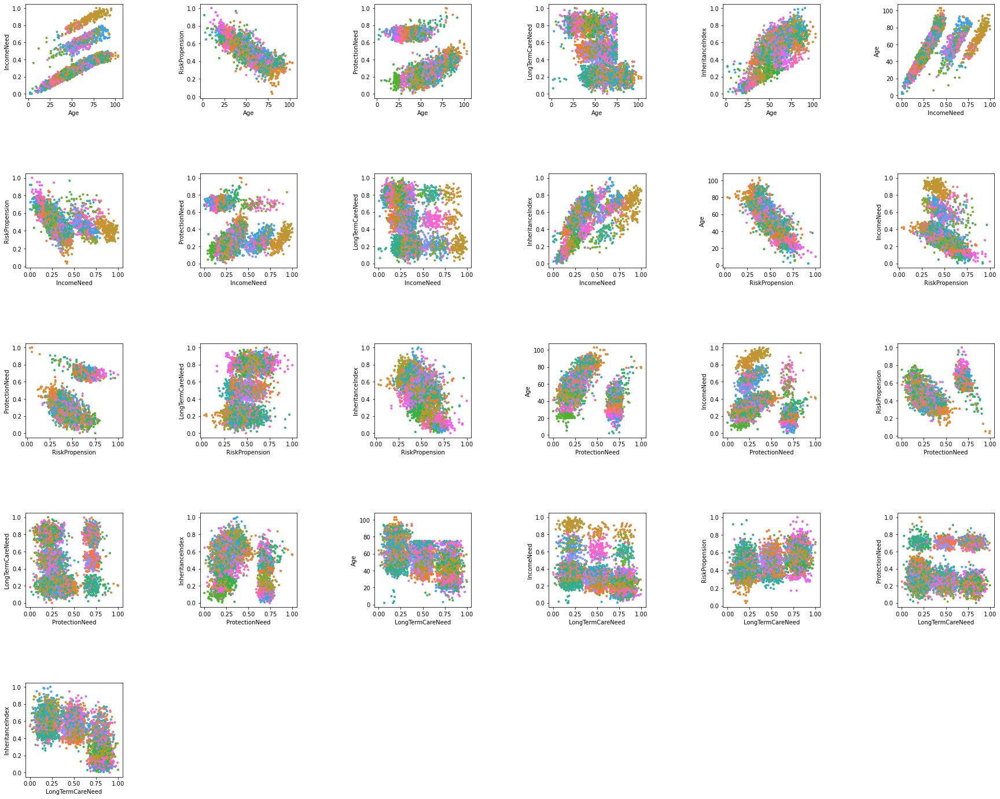

In [84]:
plot_all_vars_prob(labels=gauss_clusterer.predict(X_transformed), 
             variables=load_vars["clustering_variables"],
             data=df_person_var)

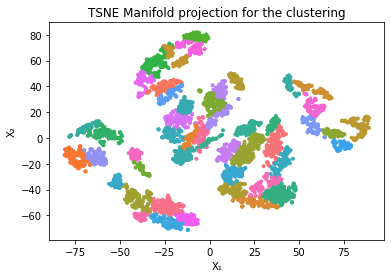

In [85]:
TSNE_manifold_plot_prob(labels=gauss_clusterer.predict(X_transformed), 
             X=X_transformed,
             transform=False)

# Conclusioni

Da queste analisi si può notare come alcune strategie risultano più forti di altre. In particolare, modelli probavilistici, come ci si poteva aspettare, non sono per niente idonei a clusterizzare i dati in mano. Tra i modelli e propotipo, solamente il **K medie** è in grado di dare risultati soddisfacienti, sebbene non brillanti: si riescono a trovare un numero sensato di cluster, ma la validazione a occhio, sia tramite uso di tutte le dimensioni che con le proiezioni, lascia a desiderare per entrambi gli approcci. 

I modelli basati su densità sono invece molto buoni. In particolare, tra i 3 proposti, l'**HDBSCAN** presenta dei risultati brillanti, nonché i più interessanti. In particolare, con entrambe le metodologie, la validazione sulla proiezione è molto buona - l'addestramento su due dimensioni ha però più forza nei risultati, in quanto non presenta praticamente outliers. L'unico problema è determinare una buona validazione su tutte le dimensioni, a causa del fatto che con i grafici *attributo vs attributo* non si riesce a distinguere molto.